## ADU Data from LA Data Portal 

In [1]:
## first I will pull the data that I need for the base maps (la times neighborhoods for now and later I will pull census blocks
## I will also pull the LA city Portal Data that contains ADU permit data where I will organize it by issue date


In [2]:
import pandas as pd
import plotly.express as px
from sodapy import Socrata
import geopandas as gpd

In [3]:
# connect to the data portal
client = Socrata("data.lacity.org", None)

# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("hyem-e7yr", 
                     limit=25000,
                     where = "issue_date between '2017-07-01T00:00:00' and '2020-11-30T00:00:00'",
                     order='issue_date desc')

# Convert to pandas DataFrame
df = pd.DataFrame.from_records(results)

# print it with .sample, which gives you random rows
df.head()

,zip_code,address_end,floor_area_l_a_building_code_definition,work_description,reference_old_permit,census_tract,permit_category,latest_status,initiating_office,assessor_parcel,...,address_fraction_end,applicant_address_2,block,location_1,of_residential_dwelling_units,applicant_business_name,unit_range_start,unit_range_end,occupancy,suffix_direction
0,90047,10208,111,ePlan Adu. CONVERT EXISTING DETACHED GARAGE IN...,20ON 2243,2380.00,Plan Check,Issued,METRO,012,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,90008,3832,0,Convert (E) detached garage to ADU per CA Govt...,20ON 2233,2342.00,Plan Check,Issued,METRO,012,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,90016,5454,1245.5,NEW TWO STORY ADU PER ORDINANCE WITH ATTACHED...,20ON 2236,2199.01,Plan Check,Issued,WEST LA,011,...,1/2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,90065,1000,0,Grading for (N) ADU Conversion and (N) office/...,20ON 2238,1862.03,Plan Check,Issued,METRO,030,...,NaN,A,25,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,90064,2833,545,CONVERT (E) DETACHED GARAGE INTO ACCESSORY DWE...,20ON 2233,2713.00,Plan Check,Issued,WEST LA,006,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df.shape

(2096, 53)

In [5]:
# columns
list(df)

['zip_code',
 'address_end',
 'floor_area_l_a_building_code_definition',
 'work_description',
 'reference_old_permit',
 'census_tract',
 'permit_category',
 'latest_status',
 'initiating_office',
 'assessor_parcel',
 'applicant_first_name',
 'zone',
 'assessor_book',
 'applicant_address_1',
 'license_expiration_date',
 'license_type',
 'valuation',
 'pcis_permit',
 'applicant_relationship',
 'address_start',
 'street_name',
 'street_suffix',
 'street_direction',
 'applicant_address_3',
 'status_date',
 'applicant_last_name',
 'license',
 'floor_area_l_a_zoning_code_definition',
 'issue_date',
 'assessor_page',
 'contractors_business_name',
 'tract',
 'lot',
 'permit_sub_type',
 'of_stories',
 'permit_type',
 'principal_first_name',
 'contractor_state',
 'principal_middle_name',
 'contractor_city',
 'principal_last_name',
 'contractor_address',
 'address_fraction_start',
 'address_fraction_end',
 'applicant_address_2',
 'block',
 'location_1',
 'of_residential_dwelling_units',
 'applica

In [6]:
## Convert data to a geodataframe since Geopandas allows us to convert different types of data into a spatial format.

adu = gpd.read_file('https://data.lacity.org/resource/hyem-e7yr.geojson')

adu.head()

,assessor_parcel,zip_code,location_1_address,work_description,:@computed_region_2dna_qi2s,applicant_address_3,floor_area_l_a_zoning_code_definition,address_fraction_end,project_number,suffix_direction,...,event_code,reference_old_permit,applicant_relationship,:@computed_region_k96s_3jcv,contractor_state,license_expiration_date,:@computed_region_qz3q_ghft,applicant_address_2,permit_sub_type,geometry
0,034,91367,None,NEW FIRE SPRINKLER SYSTEM FOR ADU PER NFPA 13...,None,"ARLETA, CA",None,None,None,None,...,None,None,Contractor,None,CA,2021-06-30T00:00:00,None,None,1 or 2 Family Dwelling,None
1,046,91316,None,NFPA13D FOR ADU. EXISTING 1'' DOMESTIC WATER ...,None,"SUN VALLEY, CA",None,None,None,None,...,None,None,Contractor,None,CA,2021-12-31T00:00:00,None,UNIT G,1 or 2 Family Dwelling,None
2,024,90025,None,"NFPA 13D SYSTEM . 1"" DOMESTIC METER SEVRVES TH...",None,None,None,None,None,None,...,None,None,Contractor,None,CA,2021-10-31T00:00:00,None,None,1 or 2 Family Dwelling,None
3,014,90034,None,NEW FIRE SPRINKLER SYSTEM FOR PER NFPA 13D FOR...,None,"WOODLAND HILLS, CA",None,None,None,None,...,None,None,Contractor,None,CA,2021-01-31T00:00:00,None,None,1 or 2 Family Dwelling,None
4,027,91436,,New fire sprinkler system for ADU per NFPA-13D...,62,"WEST HILLS,CA",None,None,None,None,...,None,None,Agent for Contractor,327,CA,2021-10-31T00:00:00,19737,None,1 or 2 Family Dwelling,POINT (-118.49822 34.14598)


In [7]:
adu = adu[['issue_date','geometry']]

# print it with .sample, which gives you random rows
adu.head()

,issue_date,geometry
0,2020-12-03T00:00:00,None
1,2020-10-30T00:00:00,None
2,2020-10-27T00:00:00,None
3,2020-09-30T00:00:00,None
4,2020-09-18T00:00:00,POINT (-118.49822 34.14598)


In [8]:
#We can a latitude and longtitude column so that we can map it
adu['x'] = adu.geometry.x
adu['y'] = adu.geometry.y

In [9]:
adu.head()

,issue_date,geometry,x,y
0,2020-12-03T00:00:00,None,NaN,NaN
1,2020-10-30T00:00:00,None,NaN,NaN
2,2020-10-27T00:00:00,None,NaN,NaN
3,2020-09-30T00:00:00,None,NaN,NaN
4,2020-09-18T00:00:00,POINT (-118.49822 34.14598),-118.49822,34.14598


In [10]:
adu = adu.dropna()

In [11]:
#Now that we have our ADU Data we can use Geopandas to allow us to convert different types of data into a spatial format.
adu.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [12]:
# get the layers into a web mercator projection
# reproject to web mercator
adu = adu.to_crs('EPSG:3857')

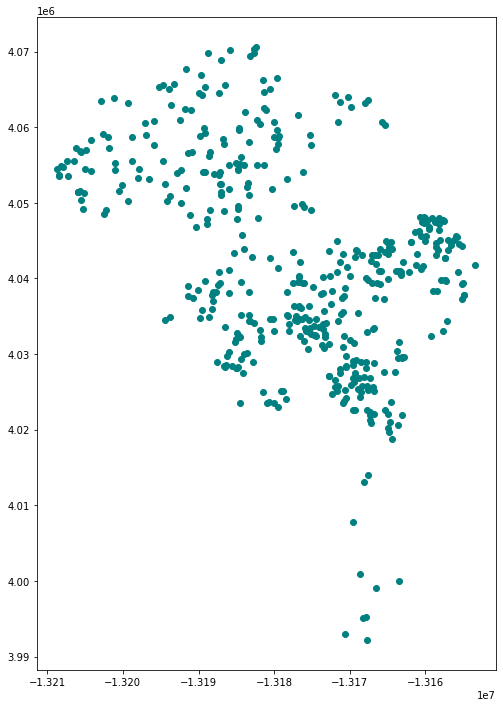

In [13]:
# map it!
adu.plot(figsize=(12,12),color='teal')

## LA Times Neighborhoods Data

In [14]:
import geopandas as gpd

In [15]:
# get neighborhood boundaries from the LA Times
neighborhoods = gpd.read_file('http://s3-us-west-2.amazonaws.com/boundaries.latimes.com/archive/1.0/boundary-set/la-county-neighborhoods-v5.geojson')

In [16]:
# get the layers into a web mercator projection
# reproject to web mercator to use contextilly library
neighborhoods = neighborhoods.to_crs(epsg=3857)

In [17]:
# trim the data to the bare minimum columns
neighborhoods = neighborhoods[['name','geometry']]
neighborhoods.head()

,name,geometry
0,Acton,"MULTIPOLYGON (((-13158255.188 4101406.840, -13..."
1,Adams-Normandie,"MULTIPOLYGON (((-13170098.527 4033826.516, -13..."
2,Agoura Hills,"MULTIPOLYGON (((-13220517.017 4051410.003, -13..."
3,Agua Dulce,"MULTIPOLYGON (((-13164050.472 4104017.260, -13..."
4,Alhambra,"MULTIPOLYGON (((-13149252.728 4042915.067, -13..."


In [18]:
neighborhoods = neighborhoods.to_crs('EPSG:3857')

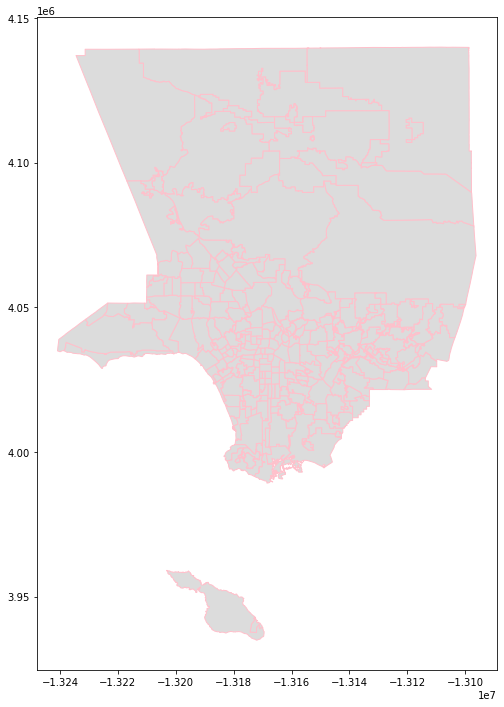

In [19]:
# plot it!
ax=neighborhoods.plot(figsize=(12,12),color='gainsboro', edgecolor='pink')

## Create a two layer map

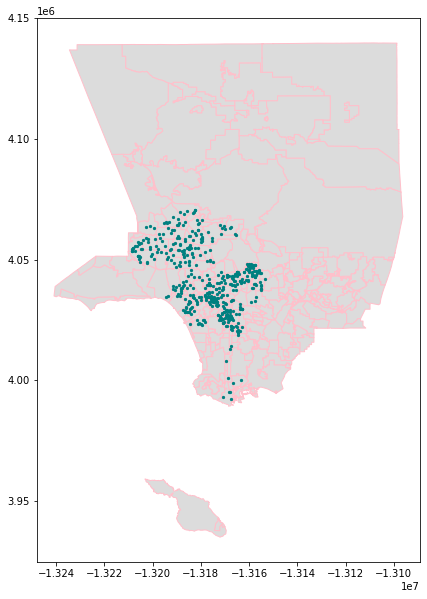

In [20]:
# first define which layers will be your "base"
base = neighborhoods.plot(figsize=(12,10),color='gainsboro', edgecolor='pink')

# define the layer that will go on top, and add the base layer to the `ax` argument
ax = adu.plot(ax=base, color='teal', markersize=5)

In [21]:
# get the bounding box coordinates for the adu data
adu.geometry.total_bounds

array([-13208653.14189765,   3992182.02224806, -13153433.10848965,
         4070591.39670432])

In [22]:
# shortcut to put them into their own variables
minx, miny, maxx, maxy = adu.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13208653.141897654
-13153433.108489651
3992182.022248056
4070591.396704316


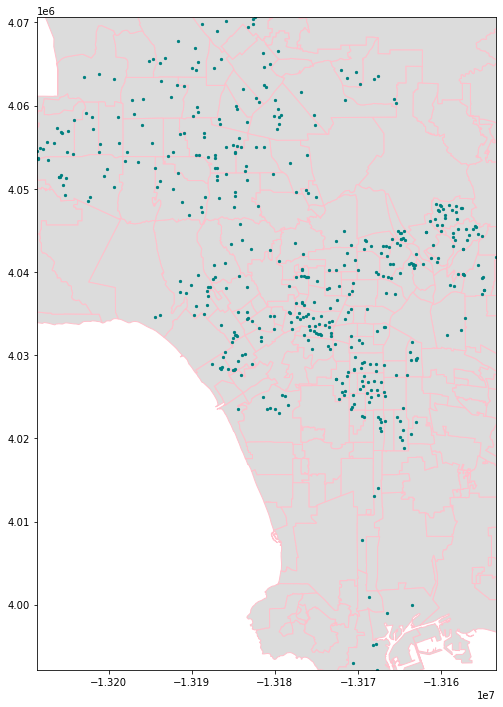

In [23]:
base = neighborhoods.plot(figsize=(12,12),color='gainsboro', edgecolor='pink')
ax = adu.plot(ax=base, marker='o', color='teal', markersize=5)
ax.set_xlim(minx - .1, maxx + .1) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - .1, maxy + .1)
ax

In [24]:
neighborhoods.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [25]:
neighborhoods.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Spatial Join

In [26]:
join = gpd.sjoin(neighborhoods,
                 adu,
                 how='right')

In [27]:
# Now every instance of adu permits is given a neighborhood it falls inside of
join.head()

,index_left,name,issue_date,geometry,x,y
749,9,Arleta,2019-08-27T00:00:00,POINT (-13181886.370 4060395.216),-118.41490,34.23496
193,9,Arleta,2020-10-21T00:00:00,POINT (-13182257.064 4060927.093),-118.41823,34.23891
172,9,Arleta,2020-09-24T00:00:00,POINT (-13183831.122 4062011.121),-118.43237,34.24696
510,10,Arlington Heights,2019-03-21T00:00:00,POINT (-13171581.525 4034382.541),-118.32233,34.04155
618,10,Arlington Heights,2019-11-06T00:00:00,POINT (-13171183.001 4035246.389),-118.31875,34.04798


In [28]:
adu_by_neighborhoods = join.name.value_counts().rename_axis('name').reset_index(name='adu_count')

In [29]:
adu_by_neighborhoods.head()

,name,adu_count
0,Eagle Rock,19
1,Van Nuys,16
2,Mid-City,16
3,Woodland Hills,14
4,Highland Park,14


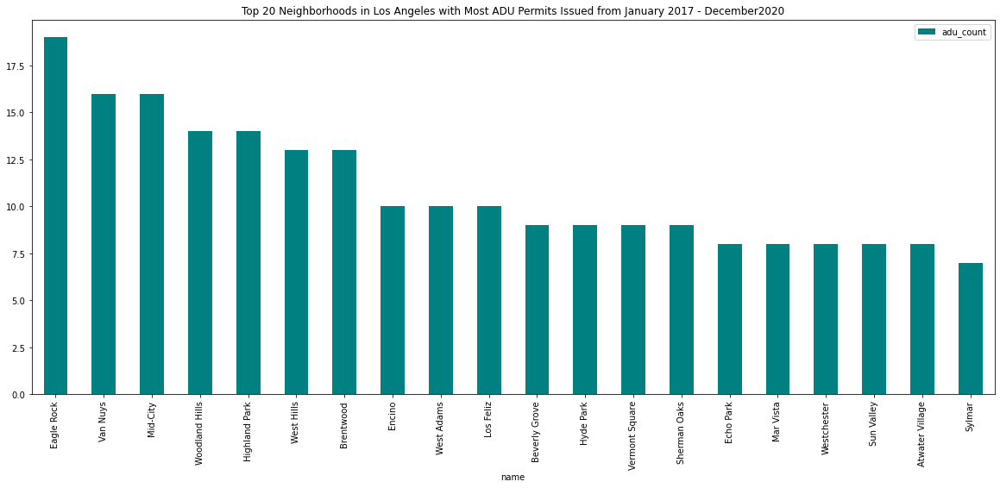

In [30]:
# make a bar chart
adu_by_neighborhoods[:20].plot.bar(figsize=(20,8),x='name',y='adu_count', color='teal', title='Top 20 Neighborhoods in Los Angeles with Most ADU Permits Issued from January 2017 - December2020')

In [31]:
# join the summary table back to the neighborhood geodatabase
neighborhoods=neighborhoods.merge(adu_by_neighborhoods,on='name')

In [32]:
neighborhoods.head()

,name,geometry,adu_count
0,Arleta,"MULTIPOLYGON (((-13182678.409 4058933.425, -13...",3
1,Arlington Heights,"MULTIPOLYGON (((-13170866.743 4035868.587, -13...",3
2,Atwater Village,"MULTIPOLYGON (((-13166682.881 4049365.698, -13...",8
3,Baldwin Hills/Crenshaw,"MULTIPOLYGON (((-13175358.707 4032137.382, -13...",4
4,Bel-Air,"MULTIPOLYGON (((-13187910.425 4046204.802, -13...",5


### Map Neighborhoods by ADU Count

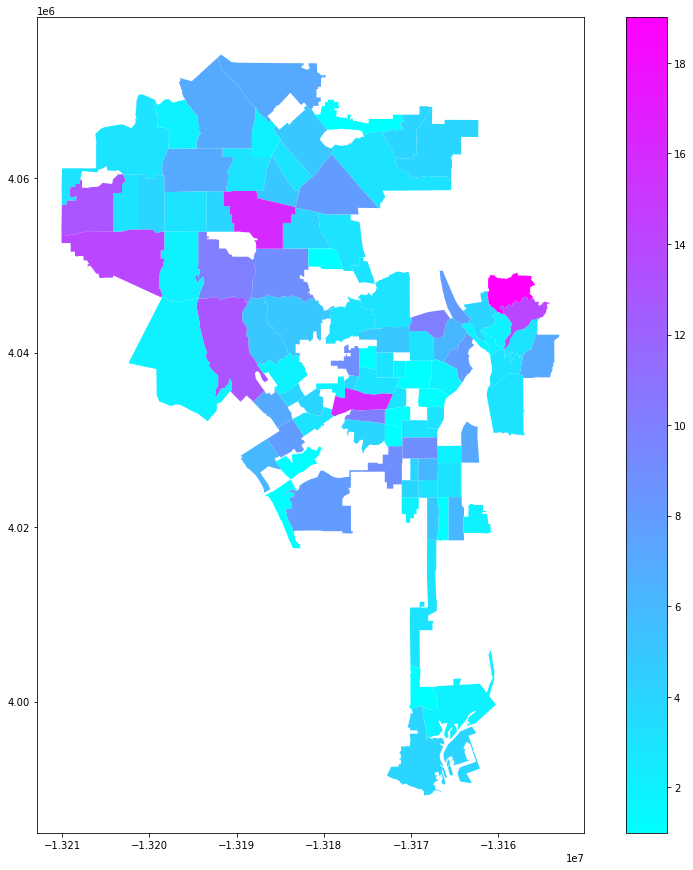

In [33]:
# plot it!
neighborhoods.plot(figsize=(15,15),column='adu_count',legend=True,cmap='cool')

In [34]:
# for basemaps
import contextily as ctx

In [35]:
# reproject to web mercator
neighborhoods = neighborhoods.to_crs(epsg=3857)

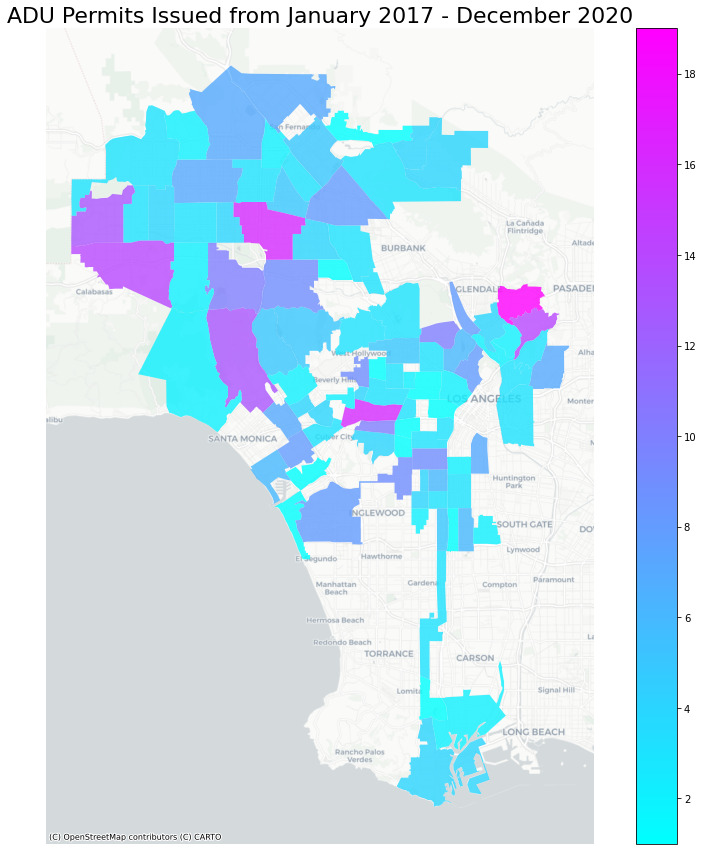

In [36]:
ax = neighborhoods.plot(figsize=(15,15),
                        column='adu_count',
                        legend=True,
                        alpha=0.8,
                        cmap='cool')

ax.axis('off')
ax.set_title('ADU Permits Issued from January 2017 - December 2020',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### Make Interactive ADU Map

To do so we will use plotly express. Since we projected our data to web mercator, note that we have to project it back to WGS84 to work with plotly.

In [37]:
import plotly.express as px

In [38]:
# reproject to web mercator
neighborhoods = neighborhoods.to_crs(epsg=4326)

In [39]:
neighborhoods.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### Get the center lat/lon to Map
Plotly maps requires you to give it center coordinates. Let's calculate this based on the data.

In [40]:
minx, miny, maxx, maxy = neighborhoods.geometry.total_bounds

In [41]:
center_lat=(maxy-miny)/2+miny
center_lat

34.020922350091055

In [42]:
center_lon=(maxx-minx)/2+minx
center_lon

-118.41173300000008

In [43]:
# map it!
fig = px.choropleth_mapbox(neighborhoods, 
                           geojson=neighborhoods.geometry, 
                           locations=neighborhoods.index, 
                           color='adu_count',
                           color_continuous_scale="tropic",
                           mapbox_style="carto-positron",
                           zoom=9, 
                           center = {"lat": center_lat, "lon": center_lon},
                           hover_name=neighborhoods.name,
                           title='TITLE',
                           opacity=0.5
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## ADU Spatial Analysis

- In this section we will look at spatial analyses techniques and will utilize ADU permit data from the LA Data Portal.

- We will find tendencies for spatial clustering our data by conducting a spatial autocorrelation analysis.

- Results will include a global Moran's I statistic, followed by a local spatial autocorrelation with a moran's plot that indicates a P-value and a scatterplot with HH, HL, LH, and LL values.

- We will produce a final output in the form of a map that indicates the location of statistically significant spatial clusters.

### Spatial Analysis Methodology

- In this study, we will look at ADU data from January 2017 - November 2020 and uncover if _ADU development locations have a statistical significant tendency to cluster in certain communities_ ?

- To answer this question, we will look at the location of **issued ADU permits in the city**, and compare these locations with developments nearby. We are seeking to see where spatial correlations occur based on the data. 

- **Our approach is:**

    - import census block group boundaries for Los Angeles

    - import ADU data from the LA Open Data Portal

    - spatially join the two datasets

    - normalize the data to create ADUs per 1000

    - conduct global spatial autocorrelation using Moran's I

    - conduct local spatial autocorrelation using Local Indicators of Spatial Association (LISAs)

In [44]:
# to read and wrangle data
import pandas as pd

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

In [45]:
# read downloaded geojson file from census reporter
gdf = gpd.read_file('data/acs2018_5yr_B01003_15000US060372711003.geojson')

In [46]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2516 entries, 0 to 2515
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             2516 non-null   object  
 1   name              2516 non-null   object  
 2   B01003001         2516 non-null   float64 
 3   B01003001, Error  2516 non-null   float64 
 4   geometry          2516 non-null   geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 98.4+ KB


In [47]:
# trim the data to the bare minimum columns
gdf = gdf[['geoid','B01003001','geometry']]

# rename the columns
gdf.columns = ['FIPS','TotalPop','geometry']

In [48]:
# last rows
gdf.tail()

,FIPS,TotalPop,geometry
2511,15000US060379800261,37.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2512,15000US060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2513,15000US060379800311,1113.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2514,15000US060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
2515,16000US0644000,3959657.0,"MULTIPOLYGON (((-118.66818 34.18987, -118.6681..."


In [49]:
# delete last column which is for the entire city of LA
gdf=gdf.drop(2515)

In [50]:
# fix FIPS code
gdf['FIPS'] = gdf['FIPS'].str.replace('15000US','')
gdf.tail()

,FIPS,TotalPop,geometry
2510,060379800241,264.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
2511,060379800261,37.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2512,060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2513,060379800311,1113.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2514,060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


In [51]:
# sort by total pop
gdf.sort_values(by='TotalPop').head(20)

,FIPS,TotalPop,geometry
2514,060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
2506,060379800201,0.0,"MULTIPOLYGON (((-118.34412 34.21700, -118.3438..."
2358,060372772002,0.0,"MULTIPOLYGON (((-118.38597 33.94734, -118.3859..."
2512,060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2509,060379800231,0.0,"MULTIPOLYGON (((-118.64870 34.23120, -118.6480..."
2508,060379800221,0.0,"MULTIPOLYGON (((-118.50266 34.30809, -118.5026..."
2501,060379800091,5.0,"MULTIPOLYGON (((-118.33707 34.14160, -118.3361..."
2503,060379800141,10.0,"MULTIPOLYGON (((-118.26088 33.76850, -118.2602..."
2507,060379800211,12.0,"MULTIPOLYGON (((-118.40183 34.26509, -118.4017..."
2511,060379800261,37.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."


In [52]:
# delete zero population geographies
gdf = gdf[gdf['TotalPop']>1]

### Map the census block groups

In [53]:
# get the layers into a web mercator projection
# reproject to web mercator
gdf = gdf.to_crs(epsg=3857)

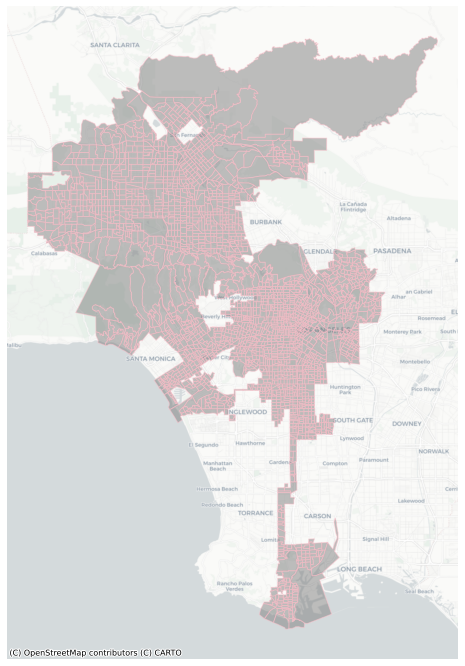

In [54]:
# plot it!
ax=gdf.plot(figsize=(12,12),
                      color='gray', 
                      edgecolor='pink',
                      alpha=0.5)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [55]:
adu.head()

,issue_date,geometry,x,y
4,2020-09-18T00:00:00,POINT (-13191161.510 4048420.457),-118.49822,34.14598
5,2020-09-15T00:00:00,POINT (-13188000.037 4053769.721),-118.46982,34.18574
6,2020-08-24T00:00:00,POINT (-13163255.940 4040464.453),-118.24754,34.08681
9,2020-08-13T00:00:00,POINT (-13167689.796 3992182.022),-118.28737,33.72684
12,2020-07-20T00:00:00,POINT (-13176210.190 4039425.487),-118.36391,34.07908


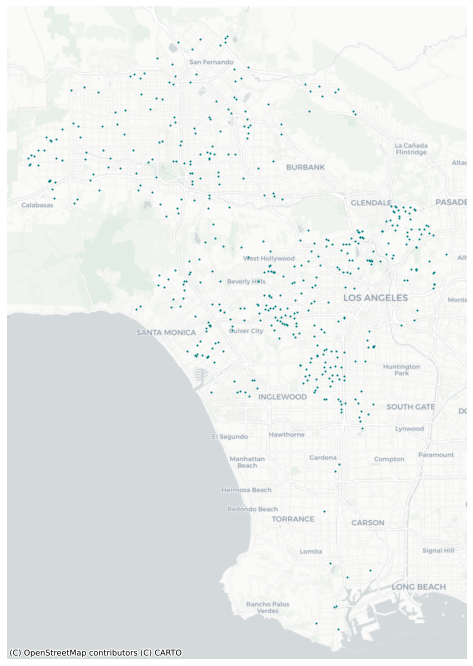

In [56]:
# map it!
ax = adu.plot(figsize=(12,12),
                  color='teal',
                  markersize=1)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [57]:
# get the bounding box coordinates for the ADU data
minx, miny, maxx, maxy = adu.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13208653.141897654
-13153433.108489651
3992182.022248056
4070591.396704316


### Subplots for Multi-Layer Maps

_Subplots allows the creation of multiple plots on a gridded canvas. For our map, we only need a single subplot, but we are layering multiple datasets on top of one another on that subplot (block groups and ADU permit data in this instance). To specify which subplot to put the layer on, you use the **ax** argument._ 

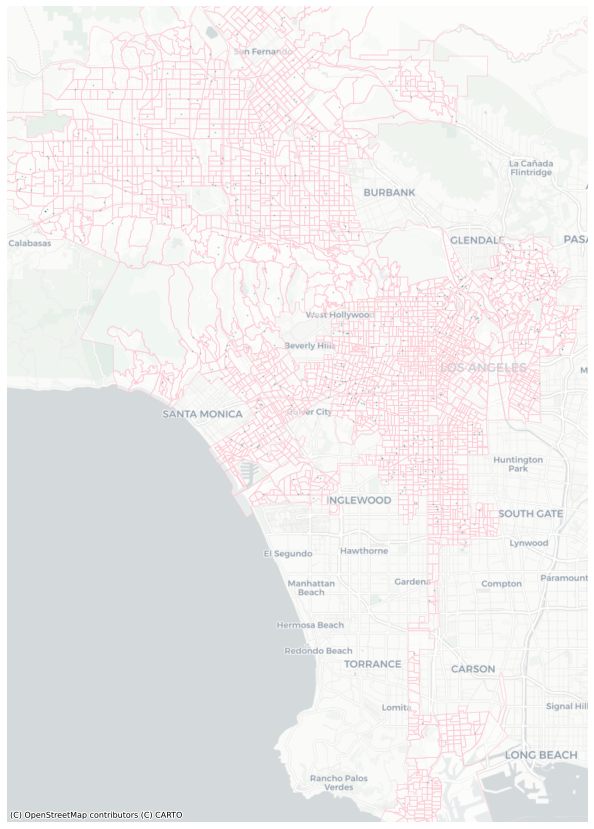

In [58]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(15, 15))

# block groups
gdf.plot(ax=ax, # this puts it in the ax plot
        color='white', 
        edgecolor='pink',
        alpha=0.5)

# ADUs
adu.plot(ax=ax, # this also puts it in the same ax plot
            color='teal',
            markersize=1,
            alpha=0.2)

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### Spatial Join (again)

- We previously did the spatial join with neighborhoods, we are not re-doing it with census block groups.

In [59]:
# Do the spatial join
join = gpd.sjoin(gdf, adu, how='right')
join.head()

,index_left,FIPS,TotalPop,issue_date,geometry,x,y
29,0,060371011101,1806.0,2020-06-16T00:00:00,POINT (-13167655.287 4063570.688),-118.28706,34.25854
200,6,060371012102,3143.0,2020-10-28T00:00:00,POINT (-13168046.018 4063201.652),-118.29057,34.25580
516,10,060371013002,1279.0,2019-09-16T00:00:00,POINT (-13165406.633 4060288.844),-118.26686,34.23417
601,10,060371013002,1279.0,2020-01-24T00:00:00,POINT (-13165741.705 4060738.577),-118.26987,34.23751
742,14,060371014002,1540.0,2020-02-24T00:00:00,POINT (-13169831.583 4062652.161),-118.30661,34.25172


In [60]:
adu_by_gdf = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='adu_count')

In [61]:
adu_by_gdf.head()

,FIPS,adu_count
0,060371370001,5
1,060371945001,4
2,060372713002,4
3,060372169004,3
4,060371883002,3


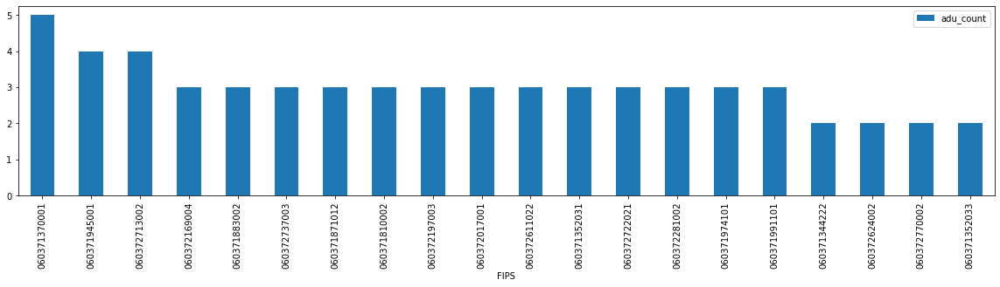

In [62]:
# make a bar chart of top 20 geographies census block groups
adu_by_gdf[:20].plot.bar(figsize=(20,4),
                             x='FIPS',
                             y='adu_count')

In [63]:
## We not merge the counts back to the block group gdf in order to make a choropleth map to accompany it.
gdf=gdf.merge(adu_by_gdf,on='FIPS')

In [64]:
# our neighborhood table now has a count column
gdf.head()

,FIPS,TotalPop,geometry,adu_count
0,060371011101,1806.0,"MULTIPOLYGON (((-13168130.287 4063777.973, -13...",1
1,060371012102,3143.0,"MULTIPOLYGON (((-13169034.646 4063225.625, -13...",1
2,060371013002,1279.0,"MULTIPOLYGON (((-13166473.296 4061829.859, -13...",2
3,060371014002,1540.0,"MULTIPOLYGON (((-13171587.314 4062370.826, -13...",1
4,060371021031,1771.0,"MULTIPOLYGON (((-13176367.818 4059552.748, -13...",1


### Normalize the Data (ADUs per 1000 People)

- Instead of proceeding with an absolute count of ADUs, we normalize it by number of people who live in the census block group.

In [65]:
gdf['adu_per_1000'] = gdf['adu_count']/gdf['TotalPop']*1000

In [66]:
gdf.sort_values(by="adu_per_1000").tail()

,FIPS,TotalPop,geometry,adu_count,adu_per_1000
366,060372737003,802.0,"MULTIPOLYGON (((-13186803.464 4028447.410, -13...",3,3.740648
353,060372713002,1066.0,"MULTIPOLYGON (((-13185005.876 4032732.144, -13...",4,3.752345
354,060372713005,532.0,"MULTIPOLYGON (((-13185660.880 4031904.885, -13...",2,3.759398
187,060371945001,1044.0,"MULTIPOLYGON (((-13176544.371 4039567.550, -13...",4,3.831418
286,060372361005,351.0,"MULTIPOLYGON (((-13173862.461 4030997.106, -13...",2,5.698006


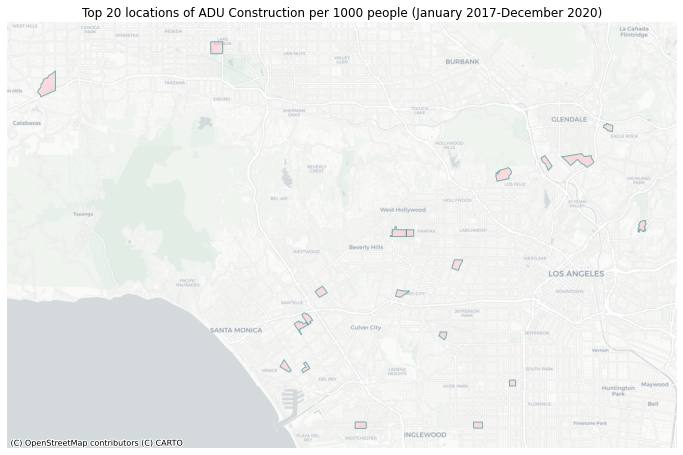

In [67]:
# We map the top 20 geographies
ax = gdf.sort_values(by='adu_per_1000',ascending=False)[:20].plot(figsize=(12,10),
                                                             color='pink',
                                                             edgecolor='teal',
                                                             alpha=0.5,legend=True)


# title
ax.set_title('Top 20 locations of ADU Construction per 1000 people (January 2017-December 2020)')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### New Choropleth Map of ADUs with Normalized Data

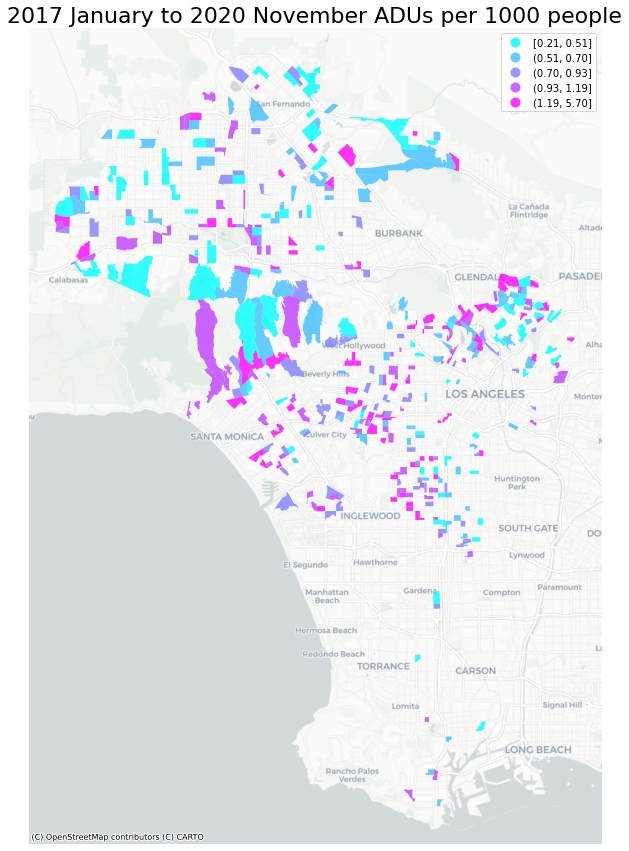

In [68]:
ax = gdf.plot(figsize=(15,15),
                        column='adu_per_1000',
                        legend=True,
                        alpha=0.8,
                        cmap='cool',
                        scheme='quantiles')

ax.axis('off')
ax.set_title('2017 January to 2020 November ADUs per 1000 people',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

_So far we have imported two datasets (ADU permits and Census Block Groups) and mapped them to show the location of ADUs per 1000 people by census block groups. The resulting map demonstrates spatial clusters of where ADU permits are being issued more frequently, **but to what degree of certainty can we say so?**_

### Global Spatial Autocorrelation

- In order to statitistically back up our determination that our ADU permits being issued are more prevalent in some census groups over others we need to use spatial correlation. Without doing this process then this pattern could be a matter of chance or coincidence. **Spatial correlation** allows us to back up the pattern is so distinct that there is no way it could have happened randomly.
- **Spatial autocorrelation is a process that determines to what degree an existing pattern is or is not random.**

#### Global Moran's I Statistic

- The Moran Statistic is a way to quantify the degree to which similar geographies are clustered. In order to do so, we compare each geography based on a given value (in this case ADU permit counts) with that of its neighbors. The first step of this process is to define a "spatial weight."
- For this exercise, we will use the KNN weight, where k is the number of "nearest neighbors" to count in the calculations. Let's proceed with k=8 for our KNN spatial weights.

In [69]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(gdf,k=8)
wq.transform = 'r'

#### Spatial Lag

- With spatial weights assigned, we use it to calculate the spatial lag. 
- The spatial lag is a calculated assignment to each geography in your data, which takes into account the data values from others in their "neighborhood" as defined by the spatial weight (k=8). This operation takes the average of all the neighbors as defined by the spatial weight to come up with a single associated value.

In [70]:
# create a new column for the spatial lag
gdf['adu_per_1000_lag'] = lps.weights.lag_spatial(wq, gdf['adu_per_1000'])

In [71]:
gdf.sort_values(by='adu_per_1000',ascending=False).sample(100)

,FIPS,TotalPop,geometry,adu_count,adu_per_1000,adu_per_1000_lag
33,060371132121,1582.0,"MULTIPOLYGON (((-13203783.805 4063514.254, -13...",1,0.632111,0.512175
119,060371396002,2284.0,"MULTIPOLYGON (((-13191962.231 4051797.492, -13...",1,0.437828,0.935168
213,060372038004,1313.0,"MULTIPOLYGON (((-13157715.124 4034724.445, -13...",1,0.761615,1.092511
363,060372731001,631.0,"MULTIPOLYGON (((-13188035.659 4029131.946, -13...",1,1.584786,1.923265
41,060371153021,4132.0,"MULTIPOLYGON (((-13197322.599 4060042.306, -13...",1,0.242014,0.447992
...,...,...,...,...,...,...
350,060372698001,1153.0,"MULTIPOLYGON (((-13180567.791 4032794.469, -13...",1,0.867303,0.820991
58,060371218022,1254.0,"MULTIPOLYGON (((-13179840.318 4058293.134, -13...",1,0.797448,0.722921
366,060372737003,802.0,"MULTIPOLYGON (((-13186803.464 4028447.410, -13...",3,3.740648,1.287850
374,060372771003,1262.0,"MULTIPOLYGON (((-13178613.689 4023422.738, -13...",1,0.792393,1.235272


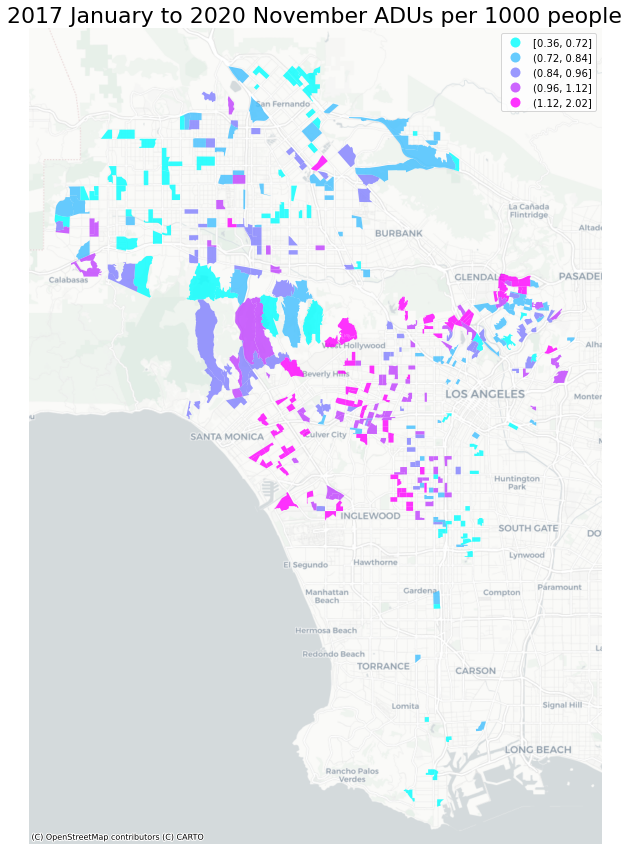

In [72]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
gdf.plot(ax=ax,
         figsize=(15,15),
         column='adu_per_1000_lag',
         legend=True,
         alpha=0.8,
         cmap='cool',
         scheme='quantiles')

# uncomment this to see the actual point locations of ADUs
# adu.plot(ax=ax, 
#              color='blue',
#              markersize =1,
#              alpha=0.2, 
#              legend=True)

ax.axis('off')
ax.set_title('2017 January to 2020 November ADUs per 1000 people',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### Side by Side Maps

- We can now compare the ADUs per 1000 and ADUs per 100 with Spatial Lag maps side by side.

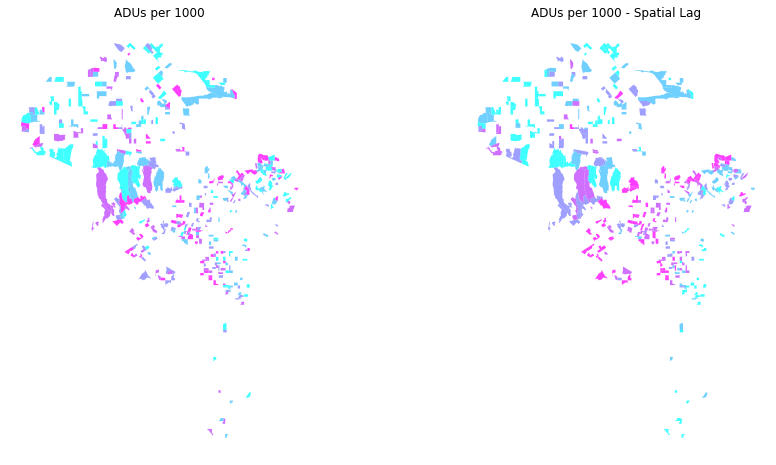

In [73]:
# create the 1x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

# name each subplot
ax1, ax2 = axs

# regular count map on the left
gdf.plot(column='adu_per_1000', 
            cmap='cool', 
            scheme='quantiles',
            k=5, 
            edgecolor='pink', 
            linewidth=0., 
            alpha=0.75, 
            ax=ax1 # this assigns the map to the subplot
           )


ax1.axis("off")
ax1.set_title("ADUs per 1000")

# spatial lag map on the right
gdf.plot(column='adu_per_1000_lag', 
            cmap='cool', 
            scheme='quantiles',
            k=5, 
            edgecolor='pink', 
            linewidth=0., 
            alpha=0.75, 
            ax=ax2 # this assigns the map to the subplot
           )

ax2.axis("off")
ax2.set_title("ADUs per 1000 - Spatial Lag")

plt.show()

In [74]:
# interactive version needs to be in WGS84
gdf_web = gdf.to_crs('EPSG:4326')

In [75]:
# what's the centroid?
minx, miny, maxx, maxy = gdf_web.geometry.total_bounds
center_lat_gdf_web = (maxy-miny)/2+miny
center_lon_gdf_web = (maxx-minx)/2+minx

In [76]:
# some stats
gdf_web.adu_per_1000_lag.describe()

count    386.000000
mean       0.938248
std        0.266259
min        0.364564
25%        0.748175
50%        0.907967
75%        1.079012
max        2.017196
Name: adu_per_1000_lag, dtype: float64

In [77]:
# set the mapbox access token
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

In [78]:
# grab the median
median = gdf_web.adu_per_1000_lag.median()

In [79]:
fig2 = px.choropleth_mapbox(gdf_web, 
                     geojson=gdf_web.geometry, 
                     locations=gdf_web.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='adu_per_1000_lag',
                     color_continuous_scale='tropic',
                     color_continuous_midpoint =median,
                     range_color =(0,median*2),
                     hover_data=['adu_count','adu_per_1000','adu_per_1000_lag'],
                     center = {"lat": center_lat_gdf_web, "lon": center_lon_gdf_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'adu_per_1000_lag':'ADUs per 1000 (Spatial Lag)',
                             'adu_per_1000':'ADUs per 1000',
                     })
fig2.update_traces(marker_line_width=0.1, marker_line_color='white')
fig2.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [80]:
fig2.write_html("ADUS_Lag_plotly.html")

_**We now have a spatial lag map: a map that displays geographies weighted against the values of its neighbors. The clusters are much clearer and cleaner than the original ADU count map.**_

### Moran's Plot

- In order to quantify the degree of the spatial correlations, we will test for global autocorrelation for a continuous attribute (ADU counts).

In [81]:
y = gdf.adu_per_1000
moran = Moran(y, wq)
moran.I

0.07557977736688808

- The moran's I value above **(0.07557977736688808)** is the calculated slope of the scatterplot of our "ADUs per 1000" and "ADUs per 1000 spatial lag" columns. It indicates whether or not we have a positive or negative autocorrelation. Values will range from positive one, to negative one.
    - Positive spatial autocorrelation: high values are close to high values, and/or low values are close to low values
    - Negative spatial autocorrelation (less common): similar values are far from each other; high values are next to low values, low values are next to high values

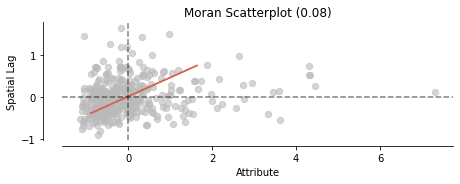

In [82]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

- In order to understand the significance of our Moran value of 0.08 -- and how likely our observed pattern on the map is generated by an entirely random process, we compare our value with a simulation of 999 permutations that randomly shuffles the ADU permit data throughout the given geographies. 
- The output is a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. 
- We then compare our observed Moran’s I value to this "Reference Distribution."

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.



(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f69de18c640>)

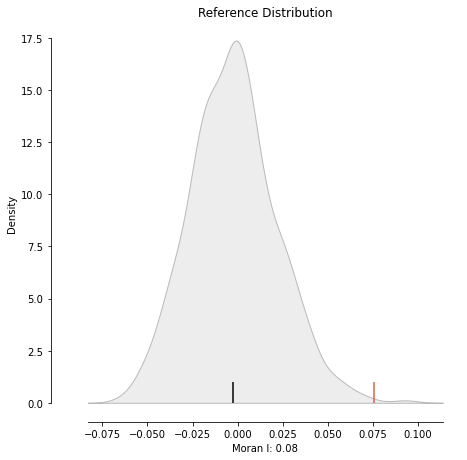

In [83]:
plot_moran_simulation(moran,aspect_equal=False)

In [84]:
# We can compute the P-value:

moran.p_sim

0.003

- The value is calculated as an empirical P-value that represents the proportion of realisations in the simulation under spatial randomness that are more extreme than the observed value. 

- A **small enough p-value** associated with the Moran’s I of a map allows us to **reject the hypothesis that the map is random**. Therefore, we can conclude that the map displays more spatial pattern than we would expect if the values had been randomly allocated to a locations.

- That is a very low value, particularly considering it is actually the minimum value we could have obtained given the simulation behind it used 999 permutations (default in PySAL) and, by standard terms, it would be deemed statistically significant. We can elaborate a bit further on the intuition behind the value of p_sim. 
- If we generated a large number of maps with the same values but randomly allocated over space, and calculated the Moran’s I statistic for each of those maps, only 0.02% of them would display a larger (absolute) value than the one we obtain from the observed data, and the other 99.98% of the random maps would receive a smaller (absolute) value of Moran’s I. 

### Local Spatial Autocorrelation

- There is a positive spatial autocorrelation between the amount of ADU permits in neighborhoods and their locations. But we have not detected where clusters are. Local Indicators of Spatial Association (LISA) is used to do that. LISA classifies areas into four groups: high values near to high values (HH), Low values with nearby low values (LL), Low values with high values in its neighborhood, and vice-versa.

    - HH: high ADU production rate geographies near other high ADU production rate neighbors
    - LL: low ADU production geographies near other low ADU production rate neighbors
    - LH (donuts): low ADU production rate geographies surrounded by high ADU production rate neighbors
    - HL (diamonds): high ADU production geographies surrounded by low ADU production rate neighbors

In [85]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

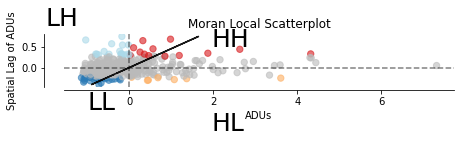

In [86]:
# Plot
fig, ax = moran_scatterplot(lisa, p=0.05)
ax.set_xlabel("ADUs")
ax.set_ylabel('Spatial Lag of ADUs')
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1.5, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

In the scatterplot above, the colored dots represents the rows that have a P-value less that 0.05 in each quadrant. In other words, these are the statisticaly significantly, spatially autocorrelated geographies.

## Spatial Autocorrelation Map

- Now that we have these values, we can visually these statistically significant clusters.

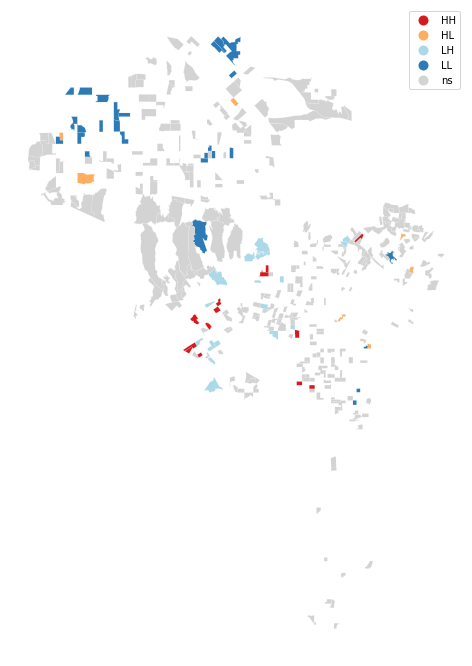

In [87]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, gdf, p=0.05, ax=ax)
plt.show()

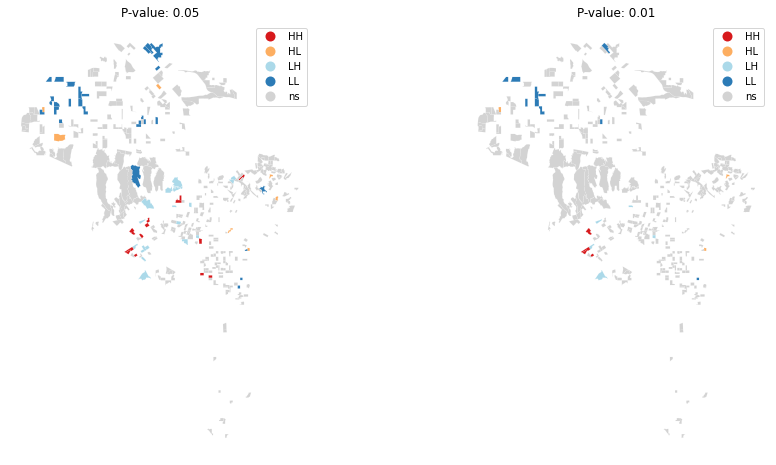

In [88]:
# create the 1x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

# name each subplot
ax1, ax2 = axs

# regular count map on the left
lisa_cluster(lisa, gdf, p=0.05, ax=ax1)

ax1.axis("off")
ax1.set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa, gdf, p=0.01, ax=ax2)
ax2.axis("off")
ax2.set_title("P-value: 0.01")

plt.show()

### Interactive LISA Map

In [89]:
# original value list
lisa.y[:5]

array([0.55370986, 0.31816736, 1.56372166, 0.64935065, 0.56465274])

In [90]:
# quadrant list
lisa.q[:5]

array([3, 3, 4, 3, 3])

In [91]:
# p sim list
lisa.p_sim[:5]

array([0.208, 0.265, 0.058, 0.189, 0.472])

In [92]:
# add quadrant numbers to the dataframe
gdf['q'] = lisa.q.tolist()

In [93]:
# add individual p-values to the dataframe
gdf['p_sim'] = lisa.p_sim.tolist()

In [94]:
gdf.head()

,FIPS,TotalPop,geometry,adu_count,adu_per_1000,adu_per_1000_lag,q,p_sim
0,060371011101,1806.0,"MULTIPOLYGON (((-13168130.287 4063777.973, -13...",1,0.553710,0.755447,3,0.208
1,060371012102,3143.0,"MULTIPOLYGON (((-13169034.646 4063225.625, -13...",1,0.318167,0.784890,3,0.265
2,060371013002,1279.0,"MULTIPOLYGON (((-13166473.296 4061829.859, -13...",2,1.563722,0.629195,4,0.058
3,060371014002,1540.0,"MULTIPOLYGON (((-13171587.314 4062370.826, -13...",1,0.649351,0.743492,3,0.189
4,060371021031,1771.0,"MULTIPOLYGON (((-13176367.818 4059552.748, -13...",1,0.564653,0.925931,3,0.472


### Hotspot Map

In [95]:
# identify just the hotspot geographies
hot_spots = gdf[(gdf.p_sim < 0.05) & (gdf.q == 1)]

In [96]:
hot_spots.shape

(13, 8)

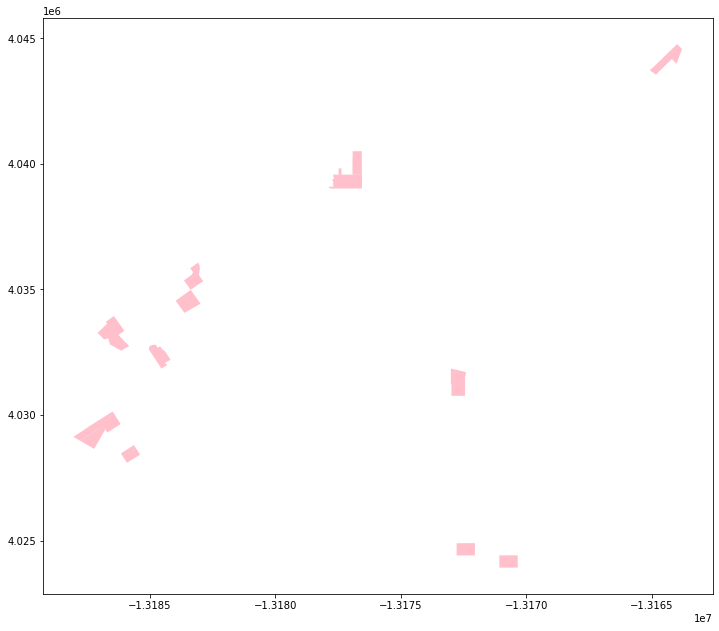

In [97]:
# quick plot... not very informative
hot_spots.plot(figsize=(12,12),color='pink',legend=True,categorical=True)

In [98]:
# interactive version needs to be in WGS84
hot_spots = hot_spots.to_crs('EPSG:4326')

In [99]:
# what's the centroid?
minx, miny, maxx, maxy = hot_spots.geometry.total_bounds
center_lat_hot_spots = (maxy-miny)/2+miny
center_lon_hot_spots = (maxx-minx)/2+minx

In [100]:
fig3 = px.choropleth_mapbox(hot_spots, 
                     geojson=hot_spots.geometry, 
                     locations=hot_spots.index, 
                     mapbox_style="satellite-streets",
                     center = {"lat": center_lat_hot_spots, "lon": center_lon_hot_spots},
                     zoom=9, 
                     opacity=0.6,
                     color='adu_per_1000_lag',
                     color_continuous_scale='tropic',
                     color_continuous_midpoint =median,
                     range_color =(0,median*2),
                     hover_data=['adu_count','adu_per_1000','adu_per_1000_lag'],
                     labels={
                             'adu_per_1000_lag':'ADUs per 1000 (Spatial Lag)',
                             'adu_per_1000':'ADUs per 1000',
                     })
fig3.update_traces(marker_line_width=1, marker_line_color='white')
fig3.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [101]:
fig3.write_html("ADUS_HOT_plotly.html")

### Map Interpretation

- Moran value of 0.09
- P-value of 0.003
- We are visualizing ADU permit approvals in the City of LA. From the statistical data it is clear that the data is statistically significant. I think the data confirms that ADUs are being produced in high home value neighborhoods.
- ADUs are still a new housing typology (only 3 years old) so there is not a lot of data. However, the hotspots remained mostly the same from the regular to the "lag" maps as seen above.
- For our own research -- Atwater Village and Leimert Park are both a hot spots. This is surprising because the permit numbers are still low for both but it shows that this is a significant amount of units relative to other patterns in the surrounding neighborhoods. There is also a lot more permits being issued in the west side of LA versus the other neighborhoods.